<a href="https://colab.research.google.com/github/ArifDwiSyafutra/2801FW1_2098KEL4/blob/master/ComputerVision_T6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CODE MATCHING TEMPLATE

In [1]:
!pip uninstall opencv-python -y

Found existing installation: opencv-python 4.7.0.72
Uninstalling opencv-python-4.7.0.72:
  Successfully uninstalled opencv-python-4.7.0.72


In [2]:
!pip install opencv-contrib-python==3.4.17.61 --force-reinstall

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.2/63.2 MB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 43.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.7.0.72
    Uninstalling opencv-contrib-python-4.7.0.72:
      Successfully uninstalled opencv-contrib-python-4.7.0.72
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imgaug 0.4.0 requires opencv-python, which is not installed.
dopamine-rl 4.0.6 requires opencv-python>=3.4.8.29, which is not installed.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you h

In [3]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt


In [ ]:
figsize = (20,20)
img = cv2.imread('/content/gd72.jpg')
img2 = cv2.imread('/content/gd71.jpg')
skala = 25

In [ ]:
lebar = int (img.shape[1]*skala/100)
panjang = int (img.shape[0]*skala/100)
lebar2 = int (img2.shape[1]*skala/100)
panjang2 = int (img2.shape[0]*skala/100)

In [ ]:
ukuran = (lebar,panjang)
ukuran2 = (lebar, panjang)

imrz = cv2.resize (img,ukuran)
imrz2 = cv2.resize (img2,ukuran)

In [ ]:
rgb = cv2.cvtColor(imrz, cv2.COLOR_BGR2RGB)
rgb2 = cv2.cvtColor(imrz2, cv2.COLOR_BGR2RGB)

In [ ]:
abu = cv2.cvtColor(rgb, cv2.COLOR_BGR2GRAY)
abu2 = cv2.cvtColor(rgb2, cv2.COLOR_BGR2GRAY)

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
kp, des = sift.detectAndCompute(abu, None)
kp2, des2 = sift.detectAndCompute(abu2, None)

In [ ]:
print("Jumlah Titik Terdeteksi = ", len(kp))
print("Jumlah Titik Terdeteksi = ", len(kp2))

Jumlah Titik Terdeteksi =  3791
Jumlah Titik Terdeteksi =  2935


In [ ]:
img3 =  cv2.drawKeypoints(rgb,kp,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img4 =  cv2.drawKeypoints(rgb2,kp2,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


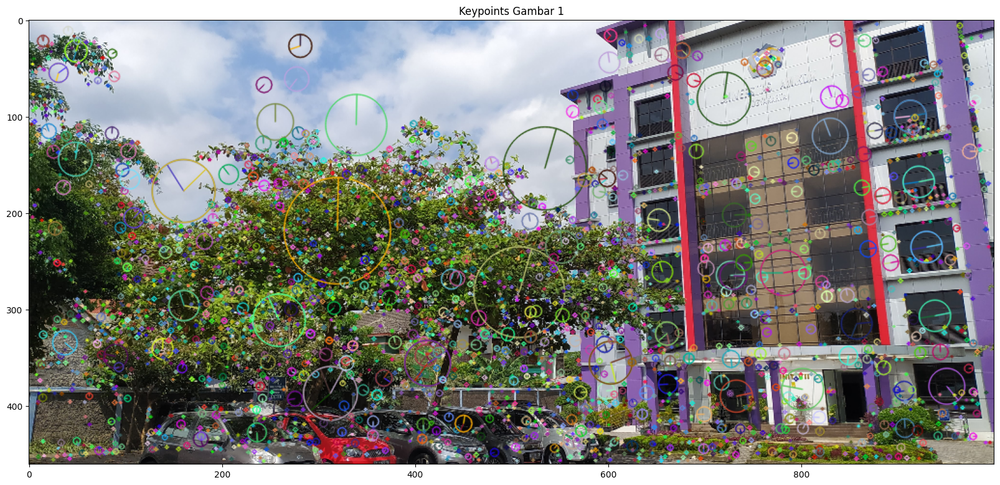

In [ ]:
plt.figure(figsize=figsize)
plt.imshow(img3)
plt.title("Keypoints Gambar 1")
plt.show()

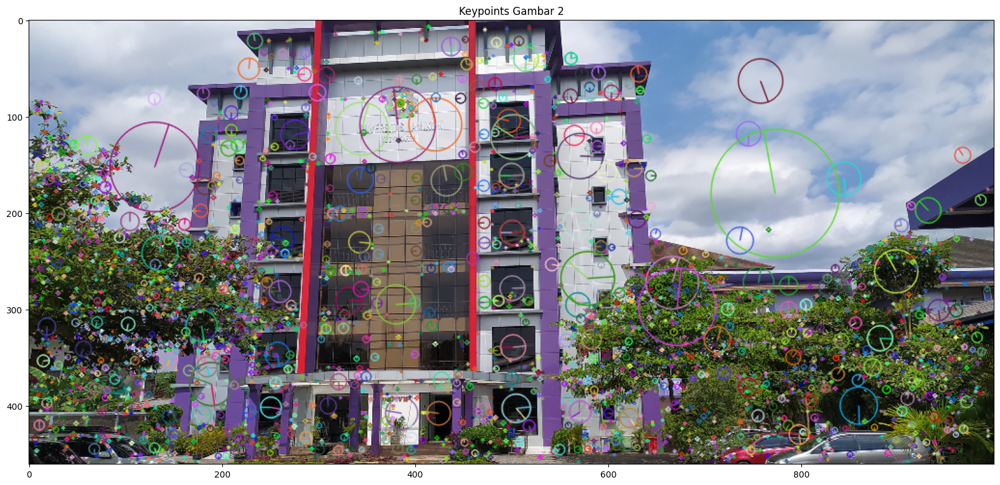

In [ ]:
plt.figure(figsize=figsize)
plt.imshow(img4)
plt.title("Keypoints Gambar 2")
plt.show()

In [ ]:
 bf = cv2.BFMatcher()
 matches = bf.knnMatch(des, des2, k=2)

In [ ]:
good_and_second_good_match_list = []
for m in matches:
  if m[0].distance/m[1].distance < 0.5:
    good_and_second_good_match_list.append(m)
    good_match_arr = np.asarray(good_and_second_good_match_list)[:,0]

In [ ]:
im_matches = cv2.drawMatchesKnn(rgb, kp, rgb2, kp2, good_and_second_good_match_list[0:60],None, flags=2)

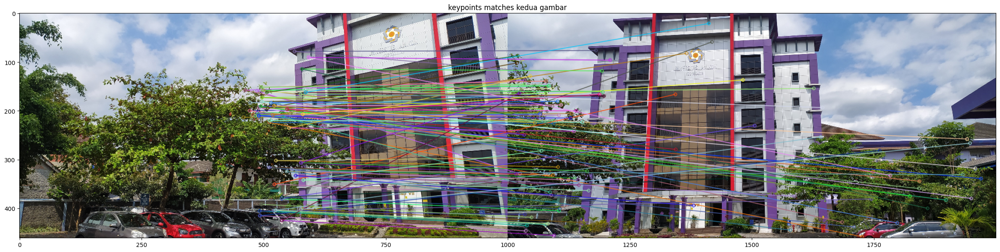

In [ ]:
plt.figure(figsize=(30,30))
plt.imshow(im_matches)
plt.title("keypoints matches kedua gambar")
plt.show()

In [ ]:
good_kp = np.array([kp[m.queryIdx].pt for m in good_match_arr])
good_kp2 = np.array([kp2[m.trainIdx].pt for m in good_match_arr])
H, masked = cv2.findHomography(good_kp2, good_kp, cv2.RANSAC, 5.0)

print(H)


[[ 3.89283353e-01  8.18627231e-02  4.26601103e+02]
 [-2.22175238e-01  8.09080708e-01  4.89110247e+01]
 [-6.03478804e-04 -1.62944728e-05  1.00000000e+00]]


In [ ]:
rgb_r_warped = cv2.warpPerspective(rgb2, H, (rgb.shape[1]+rgb2.shape[1], rgb.shape[0]))
rgb_r_warped[0:rgb.shape[0], 0:rgb.shape[1]] = rgb

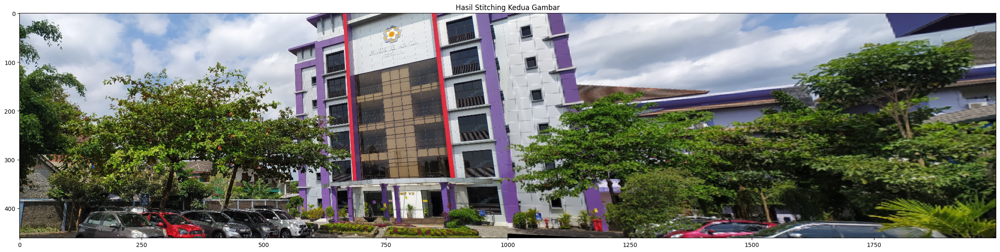

In [ ]:
plt.figure(figsize=(30,30))
plt.imshow(rgb_r_warped)
plt.title("Hasil Stitching Kedua Gambar")
plt.show()

# New Section